In [17]:
import os

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

heat = pd.read_csv("train_heat.csv", index_col=0)
heat.columns = heat.columns.str.replace("train_heat.", "", regex=False)
heat.head()

,tm,branch_id,ta,wd,ws,rn_day,rn_hr1,hm,si,ta_chi,heat_demand
1,2021010101,A,-10.1,78.3,0.5,0.0,0.0,68.2,-99.0,-8.2,281
2,2021010102,A,-10.2,71.9,0.6,0.0,0.0,69.9,-99.0,-8.6,262
3,2021010103,A,-10.0,360.0,0.0,0.0,0.0,69.2,-99.0,-8.8,266
4,2021010104,A,-9.3,155.9,0.5,0.0,0.0,65.0,-99.0,-8.9,285
5,2021010105,A,-9.0,74.3,1.9,0.0,0.0,63.5,-99.0,-9.2,283


In [18]:
# 날짜 데이터를 데이트타임으로 변경
heat['tm'] = pd.to_datetime(heat['tm'].astype(str), format="%Y%m%d%H")

heat['year'] = heat['tm'].dt.year
heat['month'] = heat['tm'].dt.month
heat['day'] = heat['tm'].dt.day
heat['hour'] = heat['tm'].dt.hour

In [19]:
heat = heat.replace(-99, np.nan)
heat = heat.dropna(subset=['heat_demand'])


In [21]:
def plot_heat_demand_by_cluster(heat, cluster_list, cluster_name):
    # 클러스터 컬럼 생성
    heat['cluster'] = np.where(
        heat['branch_id'].isin(cluster_list), cluster_name, 'Other'
    )

    # 날짜 컬럼 생성 (날짜만 추출)
    heat['date'] = heat['tm'].dt.date

    # 일별 평균 heat_demand 계산
    heat_daily_avg = heat.groupby(['cluster', 'branch_id', 'date'])['heat_demand'].mean().reset_index()

    # 클러스터 데이터 필터링
    cluster_data = heat_daily_avg[heat_daily_avg['cluster'] == cluster_name]

    # 플롯 그리기
    plt.figure(figsize=(14, 8))
    for branch in cluster_data['branch_id'].unique():
        branch_data = cluster_data[cluster_data['branch_id'] == branch]
        plt.plot(branch_data['date'], branch_data['heat_demand'], label=f'{cluster_name} - {branch}')
    plt.title(f'Heat Demand Daily Average Trend for {cluster_name}')
    plt.xlabel('Date')
    plt.ylabel('Daily Average Heat Demand')
    plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.tight_layout()
    plt.show()


In [30]:
def silhouette_score_for_heat_dynamic(heat, clusters_dict):
    import pandas as pd
    from sklearn.metrics import silhouette_score

    # branch별 heat_demand 통계 feature 생성
    features = heat.groupby('branch_id')['heat_demand'].agg(['mean', 'std', 'max', 'min']).reset_index()

    # clusters_dict는 { 'Cluster 0': [...], 'Cluster 1': [...], ... } 형태
    # branch_id에 맞게 클러스터 라벨 붙이기
    cluster_map = {}
    for cluster_name, branch_list in clusters_dict.items():
        for bid in branch_list:
            cluster_map[bid] = cluster_name

    features['cluster'] = features['branch_id'].map(cluster_map)

    # cluster 컬럼을 숫자 코드로 변환
    cluster_codes = features['cluster'].astype('category').cat.codes

    # feature 컬럼들
    feature_cols = ['mean', 'std', 'max', 'min']

    score = silhouette_score(features[feature_cols], cluster_codes)
    print(f'Silhouette Score: {score:.3f}')
    return score


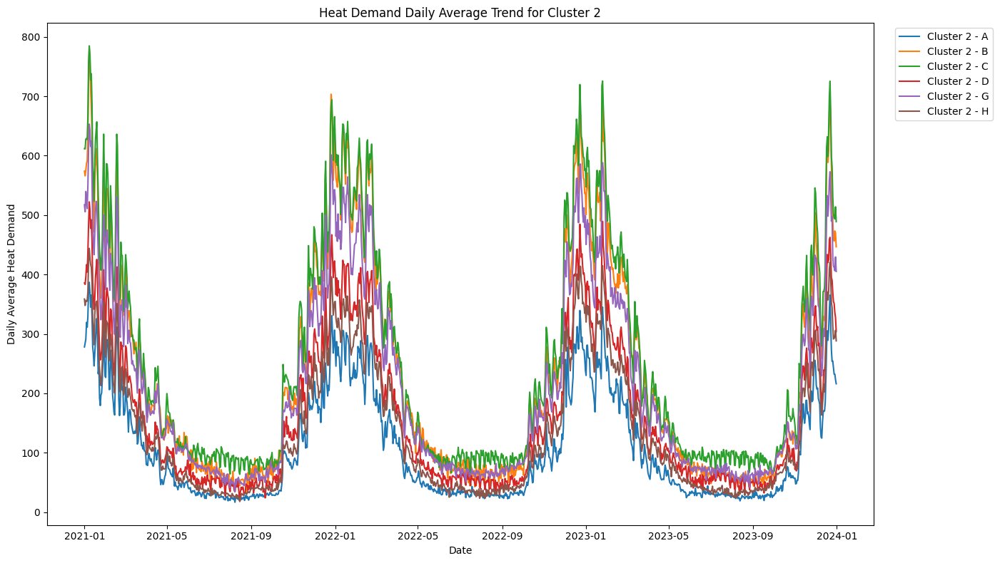

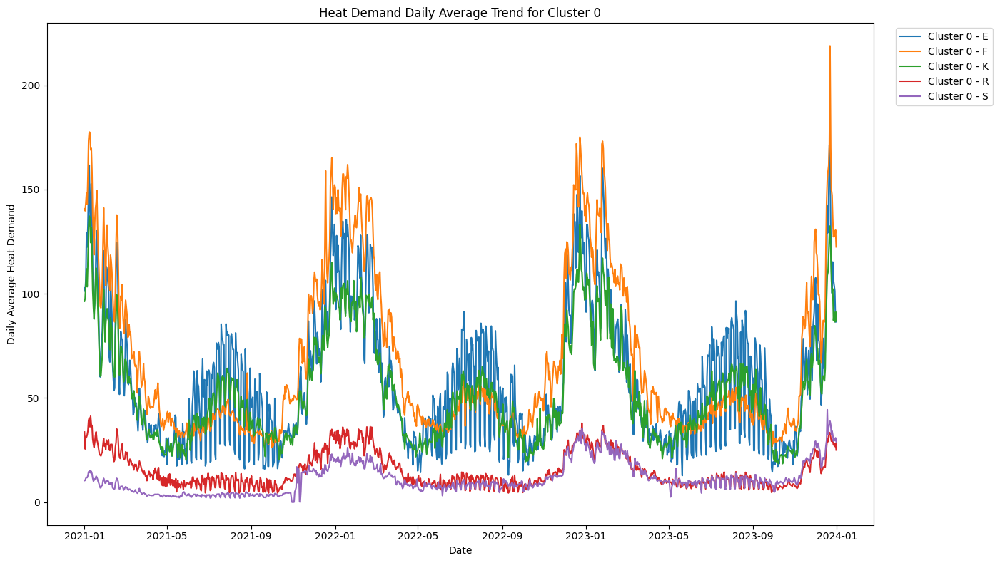

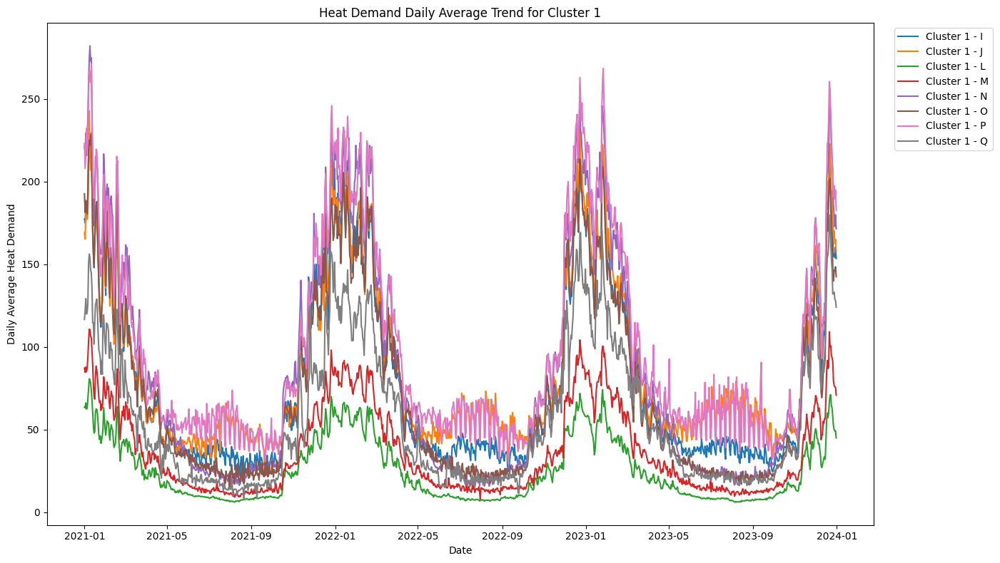

Silhouette Score: 0.212


In [31]:
# 수미- 클러스터((로그)월별 추세, (로그)히트맵, 추세, 풍향)
cluster_2 = ['A', 'B', 'C', 'D', 'G', 'H']
cluster_0 = ['E', 'F', 'K', 'R', 'S']
cluster_1 = ['I', 'J', 'L', 'M', 'N', 'O', 'P', 'Q']

plot_heat_demand_by_cluster(heat, cluster_2, 'Cluster 2')
plot_heat_demand_by_cluster(heat, cluster_0, 'Cluster 0')
plot_heat_demand_by_cluster(heat, cluster_1, 'Cluster 1')

clusters_dict = {
    'Cluster 2': cluster_2,
    'Cluster 0': cluster_0,
    'Cluster 1': cluster_1
}
silhouette_score_value = silhouette_score_for_heat_dynamic(heat, clusters_dict)

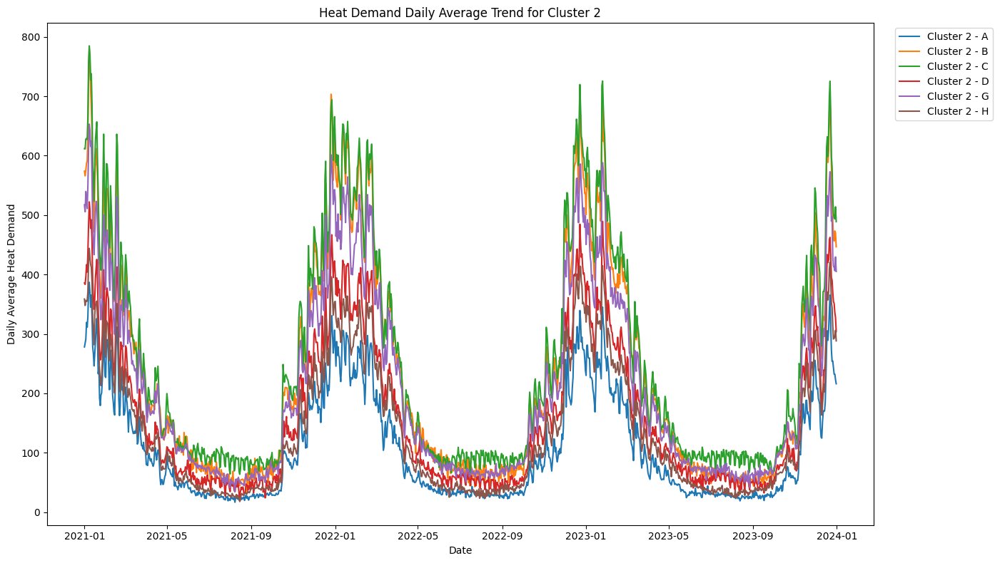

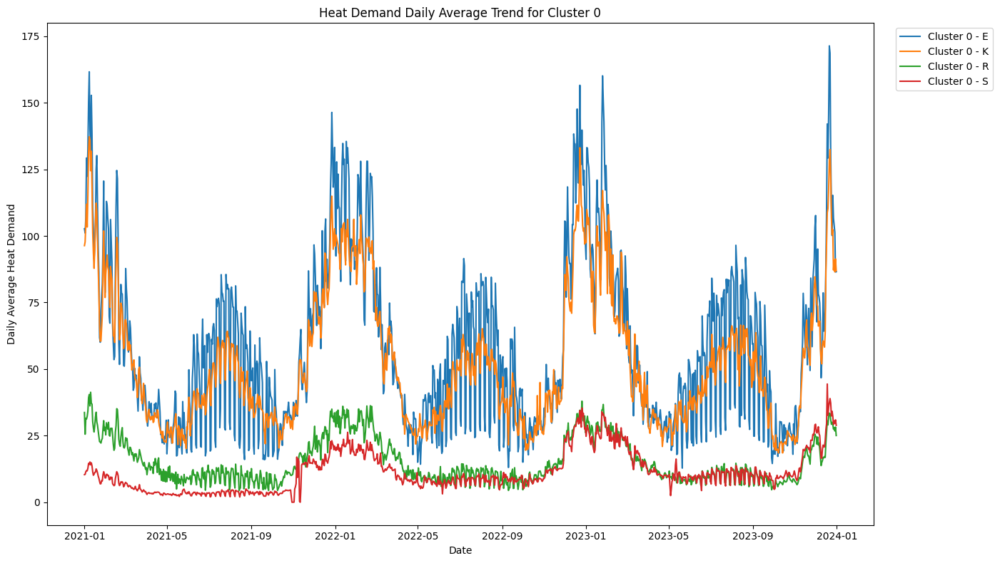

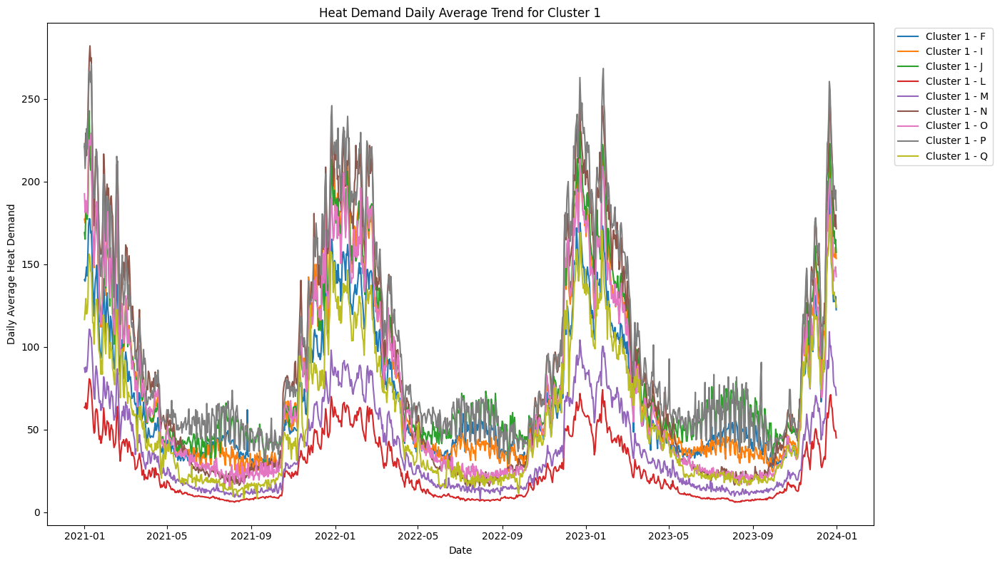

Silhouette Score: 0.278


In [32]:
# 수미- 클러스터-월별 추세, 히트맵, (로그)추세, 풍향
cluster_2 = ['A', 'B', 'C', 'D', 'G', 'H']
cluster_0 = ['E', 'K', 'R', 'S']
cluster_1 = ['F', 'I', 'J', 'L', 'M', 'N', 'O', 'P', 'Q']

plot_heat_demand_by_cluster(heat, cluster_2, 'Cluster 2')
plot_heat_demand_by_cluster(heat, cluster_0, 'Cluster 0')
plot_heat_demand_by_cluster(heat, cluster_1, 'Cluster 1')

clusters_dict = {
    'Cluster 2': cluster_2,
    'Cluster 0': cluster_0,
    'Cluster 1': cluster_1
}
silhouette_score_value = silhouette_score_for_heat_dynamic(heat, clusters_dict)

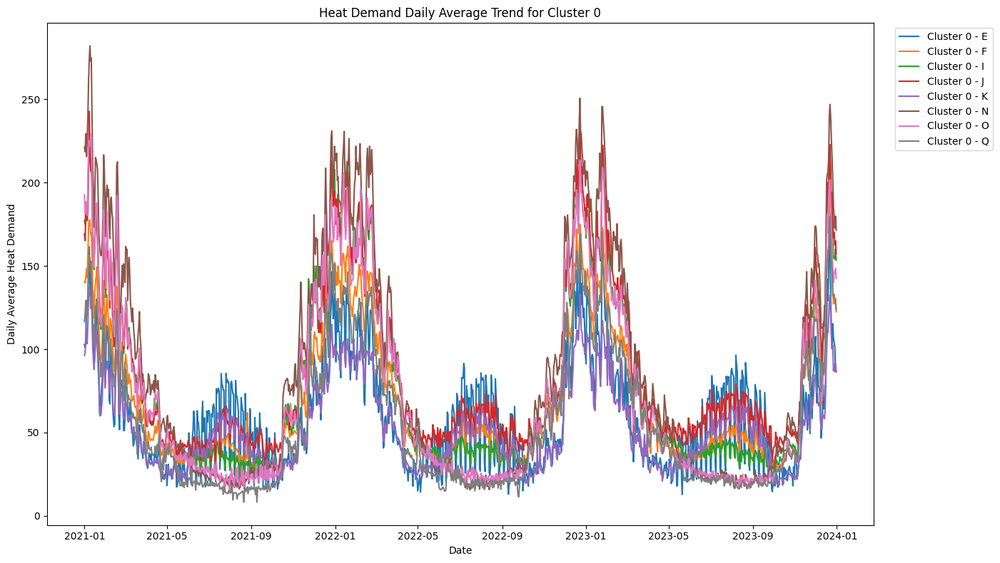

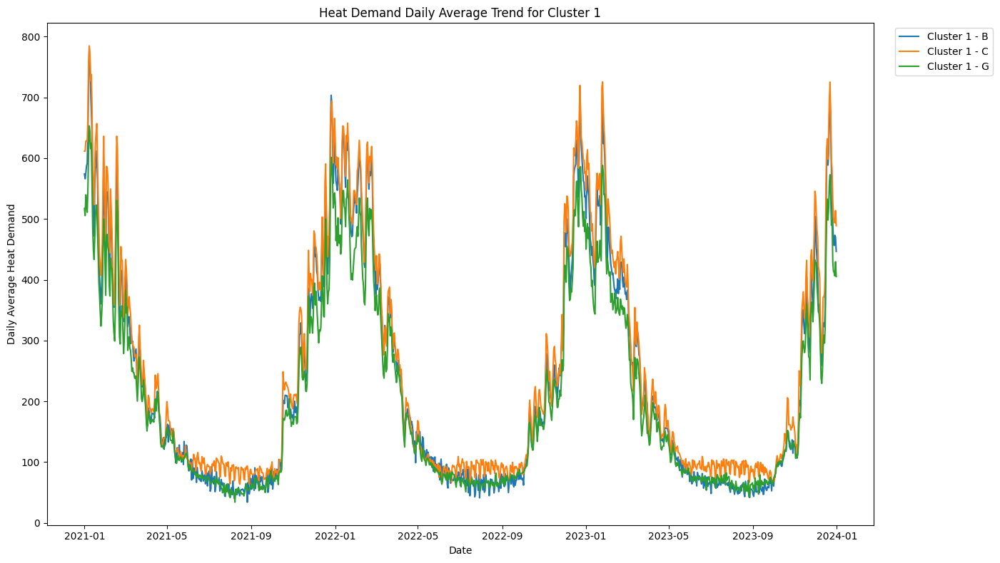

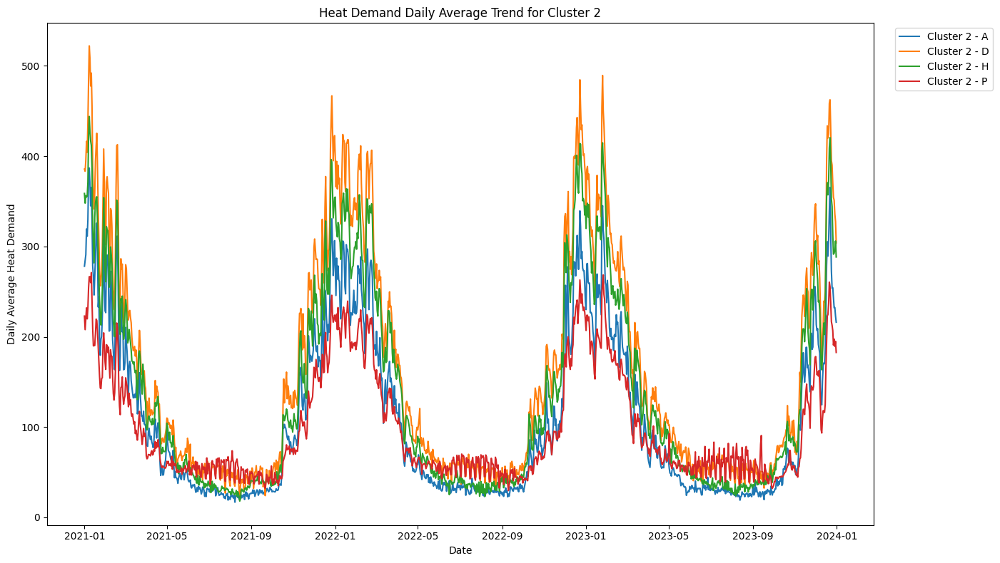

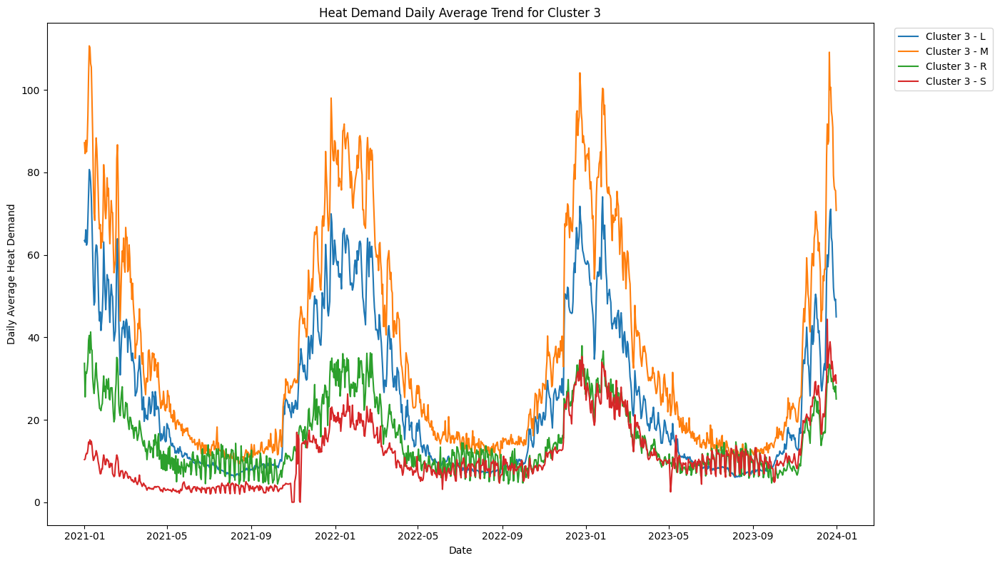

Silhouette Score: 0.448


In [33]:
# 혜현- 열수요만 고려 + 정규화 X + 클러스터 개수 =4
cluster_0 = ['E', 'F', 'I', 'J', 'K', 'N', 'O', 'Q']
cluster_1 = ['B', 'C', 'G']
cluster_2 = ['A', 'D', 'H', 'P']
cluster_3 = ['L', 'M', 'R', 'S']

plot_heat_demand_by_cluster(heat, cluster_0, 'Cluster 0')
plot_heat_demand_by_cluster(heat, cluster_1, 'Cluster 1')
plot_heat_demand_by_cluster(heat, cluster_2, 'Cluster 2')
plot_heat_demand_by_cluster(heat, cluster_3, 'Cluster 3')

clusters_dict = {
    'Cluster 2': cluster_2,
    'Cluster 0': cluster_0,
    'Cluster 1': cluster_1,
    'Cluster 3': cluster_3
}
silhouette_score_value = silhouette_score_for_heat_dynamic(heat, clusters_dict)

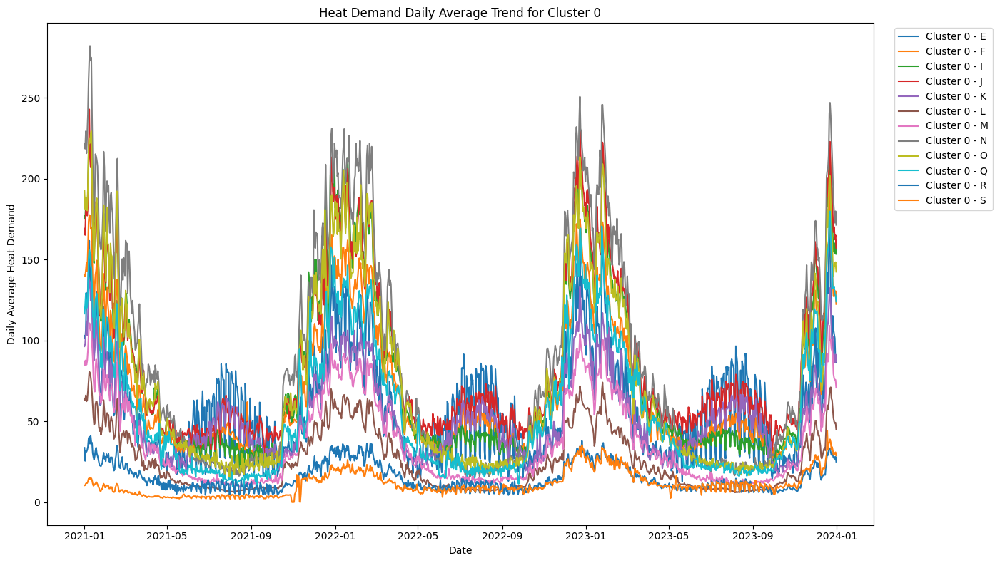

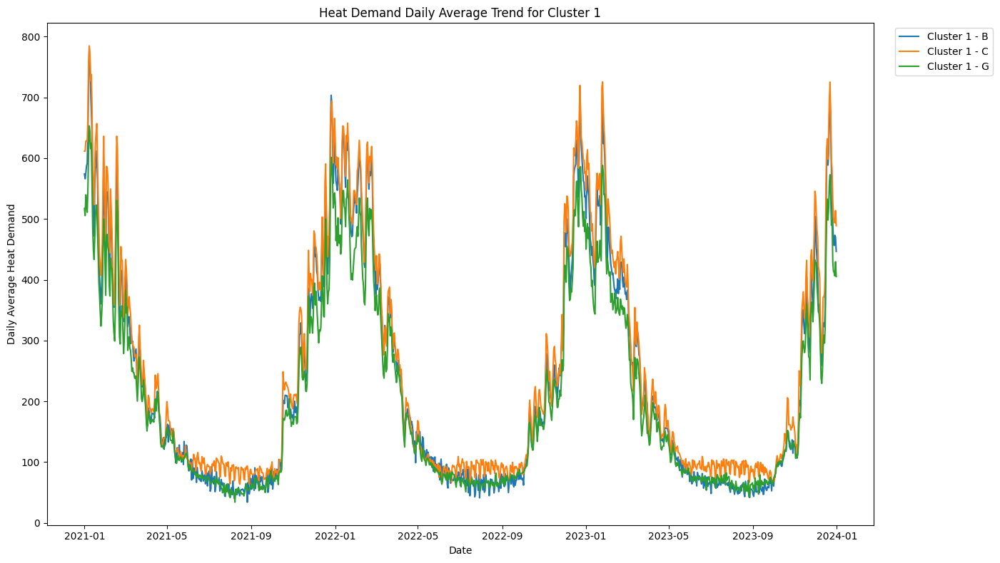

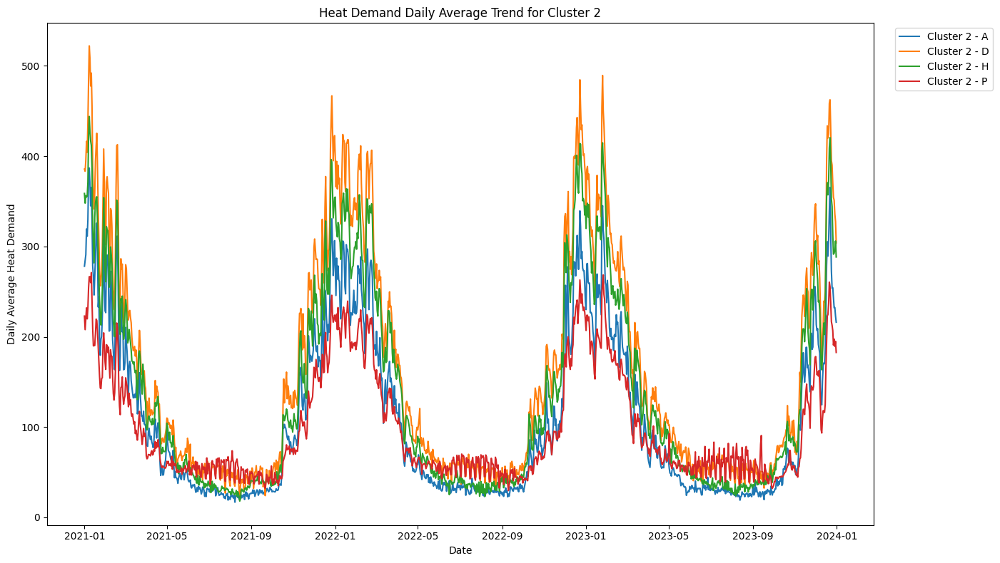

Silhouette Score: 0.468


In [36]:
# 혜현- 열수요만 고려 + 정규화 X + 클러스터 개수 =3
cluster_0 = ['E', 'F', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'Q', 'R', 'S']
cluster_1 = ['B', 'C', 'G']
cluster_2 = ['A', 'D', 'H', 'P']

plot_heat_demand_by_cluster(heat, cluster_0, 'Cluster 0')
plot_heat_demand_by_cluster(heat, cluster_1, 'Cluster 1')
plot_heat_demand_by_cluster(heat, cluster_2, 'Cluster 2')

clusters_dict = {
    'Cluster 2': cluster_2,
    'Cluster 0': cluster_0,
    'Cluster 1': cluster_1
}
silhouette_score_value = silhouette_score_for_heat_dynamic(heat, clusters_dict)

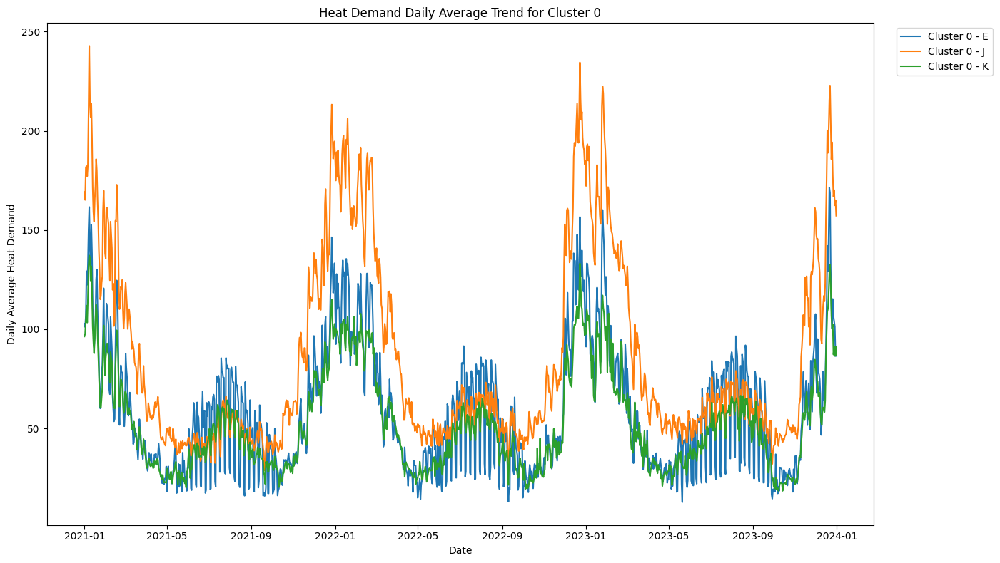

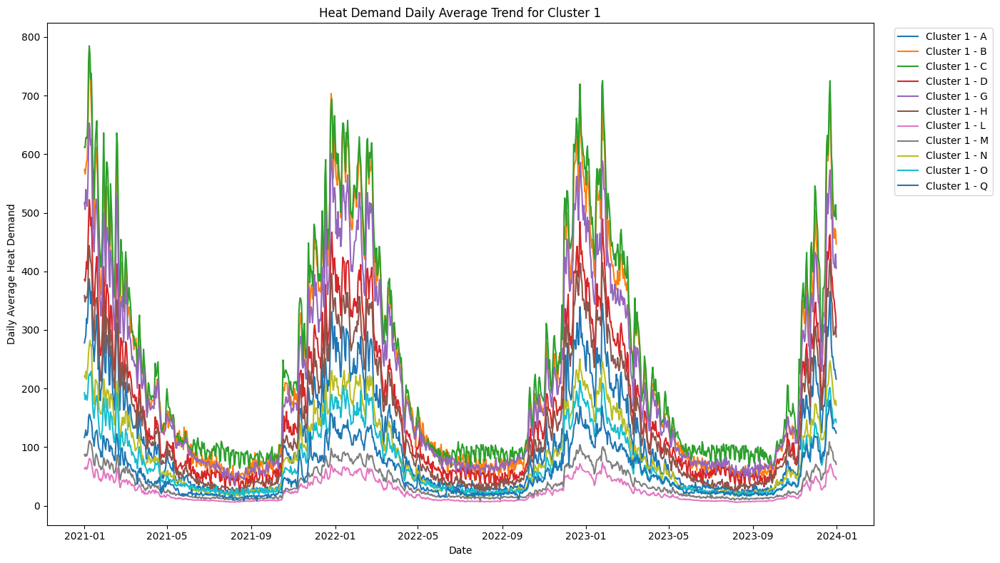

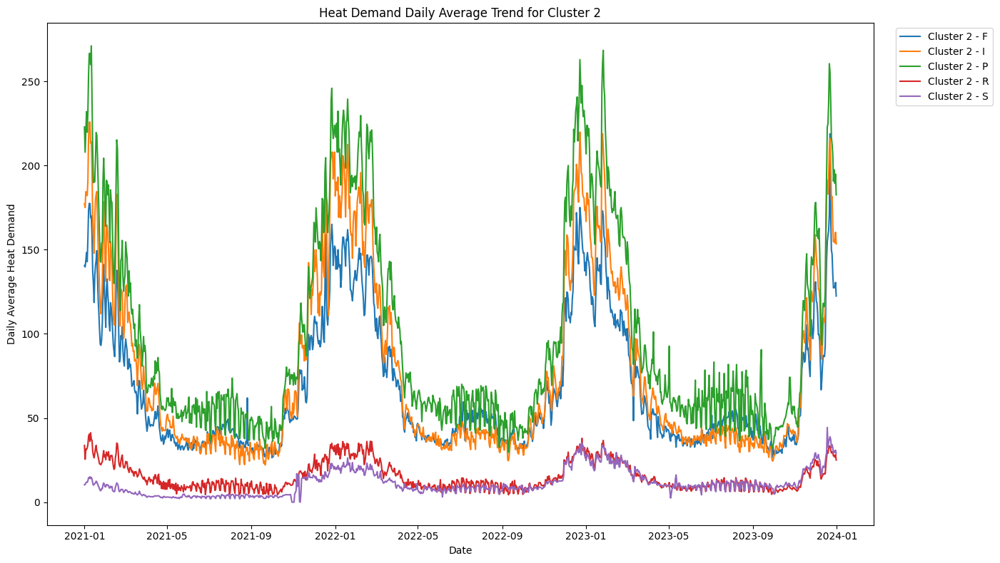

Silhouette Score: -0.173


In [35]:
# 혜현- 열수요만 고려 + 정규화 O + 클러스터 개수 =3
cluster_0 = ['E', 'J', 'K']
cluster_1 = ['A', 'B', 'C', 'D', 'G', 'H', 'L', 'M', 'N', 'O', 'Q']
cluster_2 = ['F', 'I', 'P', 'R', 'S']

plot_heat_demand_by_cluster(heat, cluster_0, 'Cluster 0')
plot_heat_demand_by_cluster(heat, cluster_1, 'Cluster 1')
plot_heat_demand_by_cluster(heat, cluster_2, 'Cluster 2')

clusters_dict = {
    'Cluster 2': cluster_2,
    'Cluster 0': cluster_0,
    'Cluster 1': cluster_1
}
silhouette_score_value = silhouette_score_for_heat_dynamic(heat, clusters_dict)

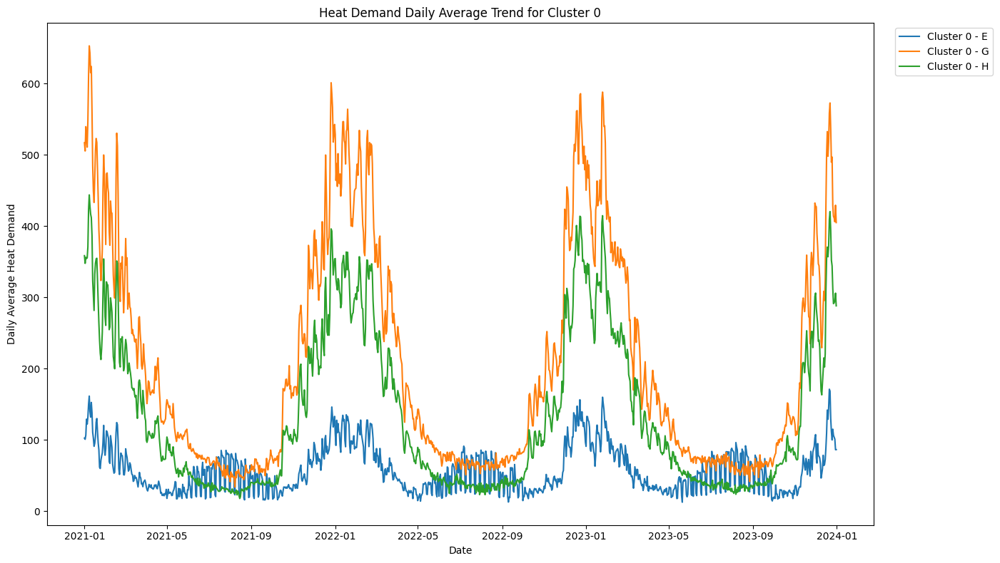

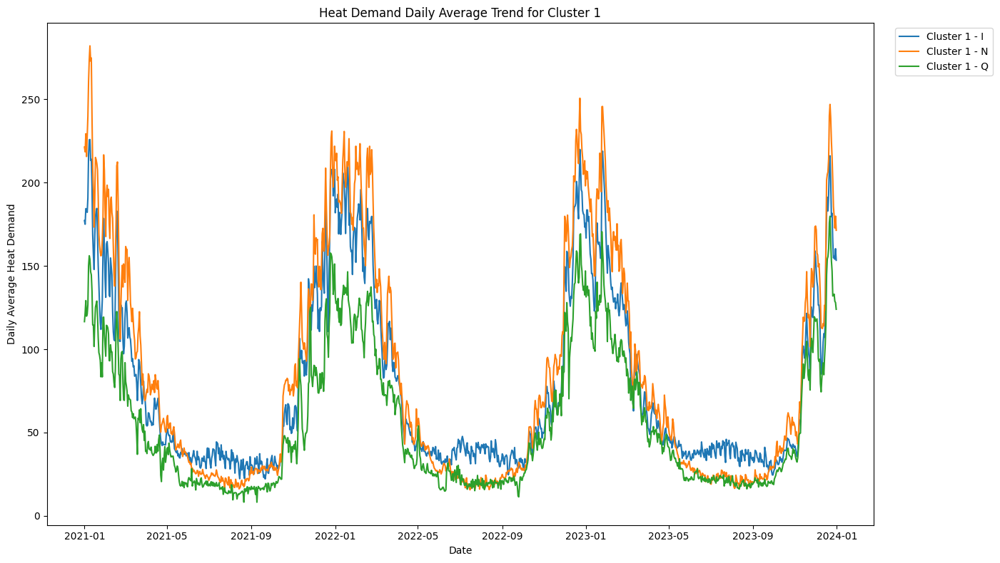

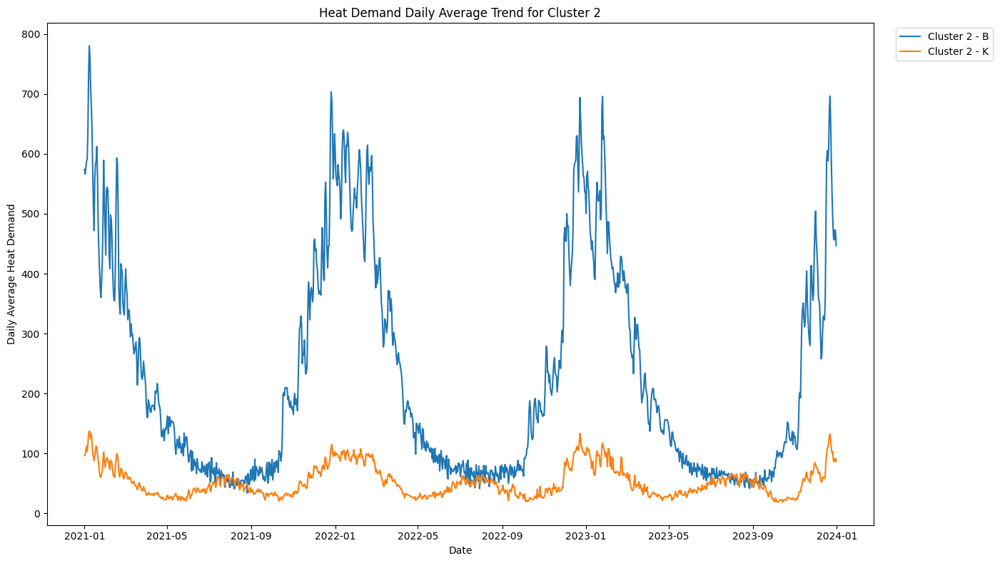

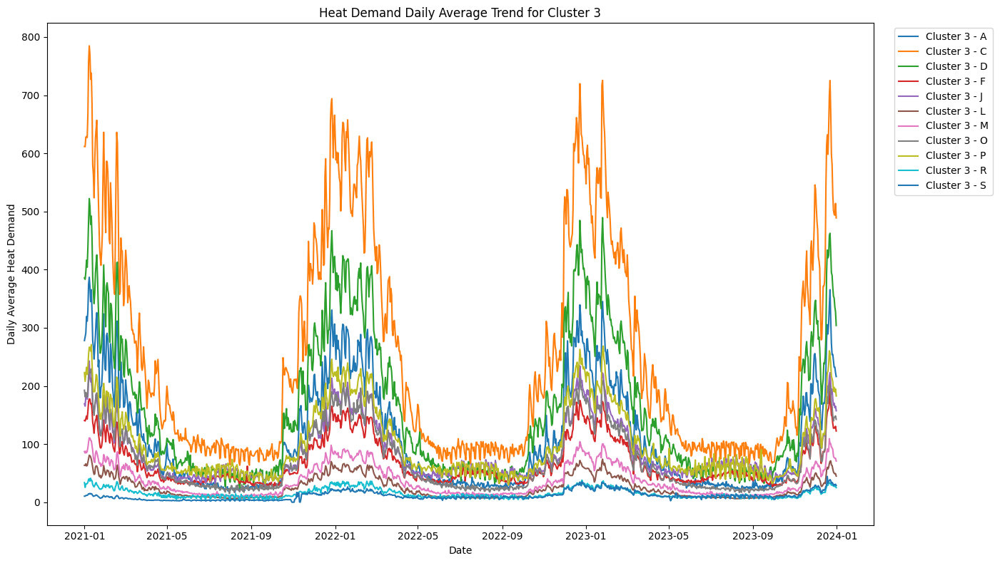

Silhouette Score: -0.294


In [37]:
# 도현 - 오토인코더(정규화O/타겟변수만/클러스터 4개)

cluster_0 = ['E', 'G', 'H']
cluster_1 = ['I', 'N', 'Q']
cluster_2 = ['B', 'K']
cluster_3 = ['A', 'C', 'D', 'F', 'J', 'L', 'M', 'O', 'P','R','S']

plot_heat_demand_by_cluster(heat, cluster_0, 'Cluster 0')
plot_heat_demand_by_cluster(heat, cluster_1, 'Cluster 1')
plot_heat_demand_by_cluster(heat, cluster_2, 'Cluster 2')
plot_heat_demand_by_cluster(heat, cluster_3, 'Cluster 3')

clusters_dict = {
    'Cluster 2': cluster_2,
    'Cluster 0': cluster_0,
    'Cluster 1': cluster_1,
    'Cluster 3': cluster_3
}
silhouette_score_value = silhouette_score_for_heat_dynamic(heat, clusters_dict)


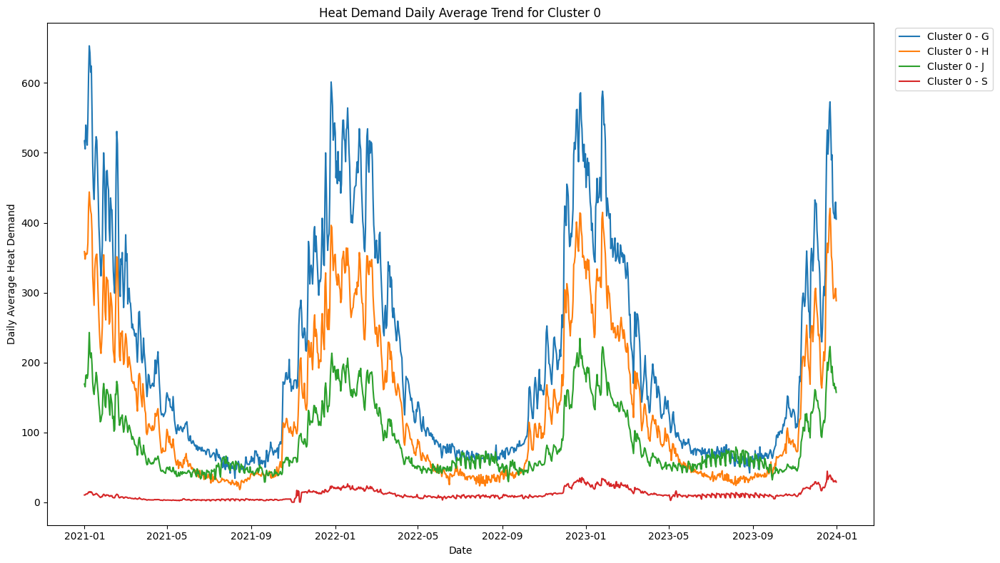

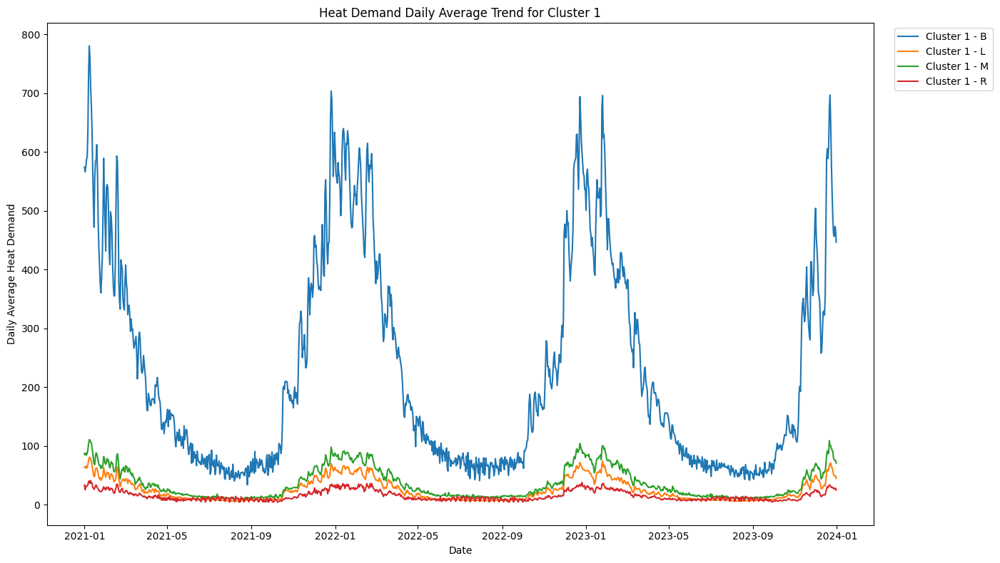

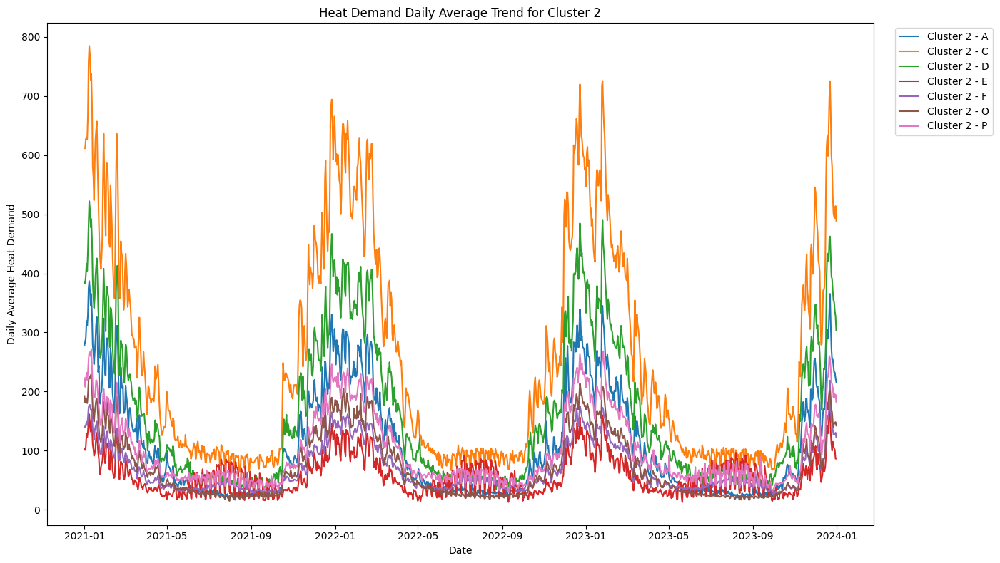

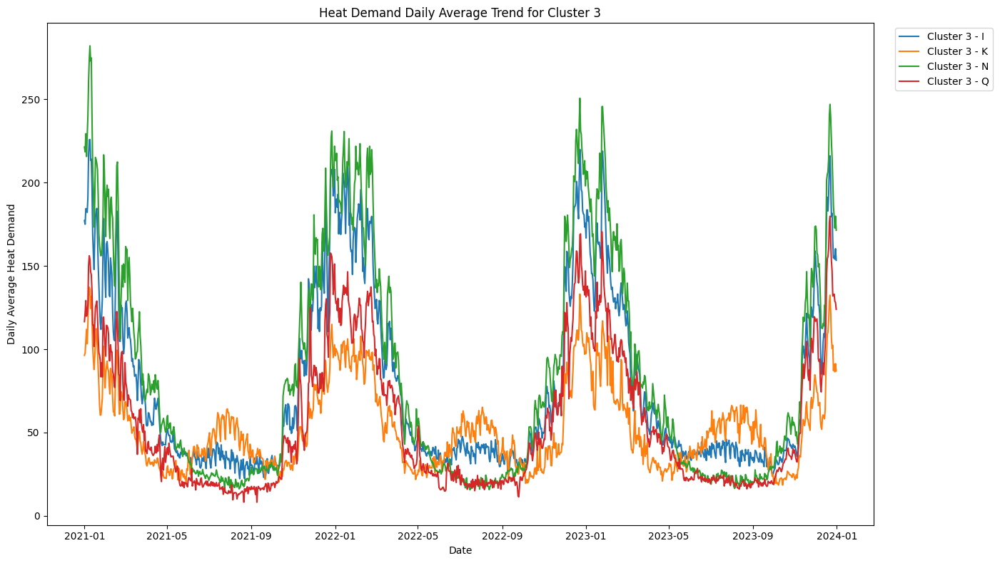

Silhouette Score: -0.258


In [38]:
# 도현 - 오토인코더(정규화O/전체변수/클러스터 4개)

cluster_0 = ['G','H', 'J','S']
cluster_1 = ['B','L','M','R']
cluster_2 = ['A','C','D','E','F','O','P']
cluster_3 = ['I','K','N','Q']

plot_heat_demand_by_cluster(heat, cluster_0, 'Cluster 0')
plot_heat_demand_by_cluster(heat, cluster_1, 'Cluster 1')
plot_heat_demand_by_cluster(heat, cluster_2, 'Cluster 2')
plot_heat_demand_by_cluster(heat, cluster_3, 'Cluster 3')

clusters_dict = {
    'Cluster 2': cluster_2,
    'Cluster 0': cluster_0,
    'Cluster 1': cluster_1,
    'Cluster 3': cluster_3
}
silhouette_score_value = silhouette_score_for_heat_dynamic(heat, clusters_dict)

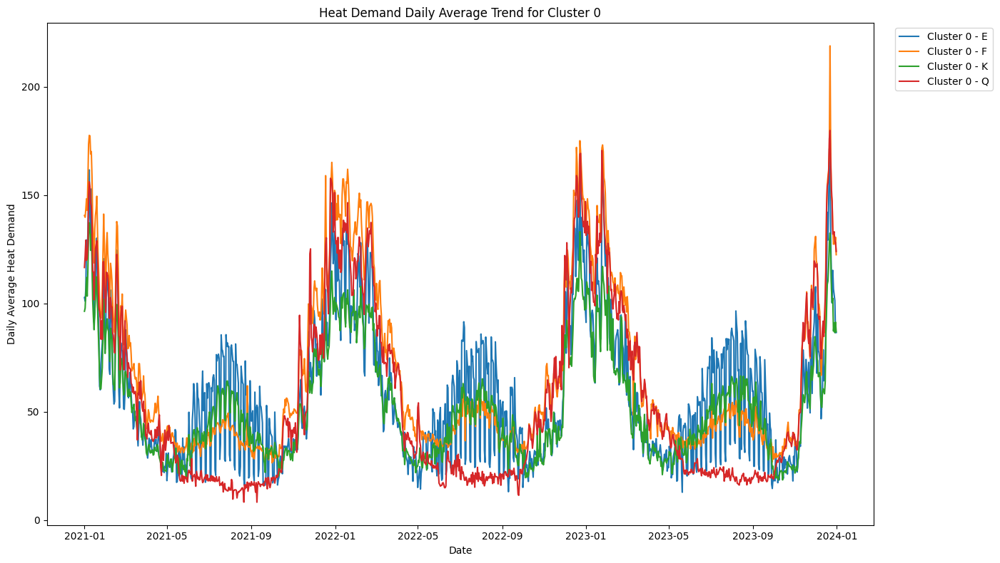

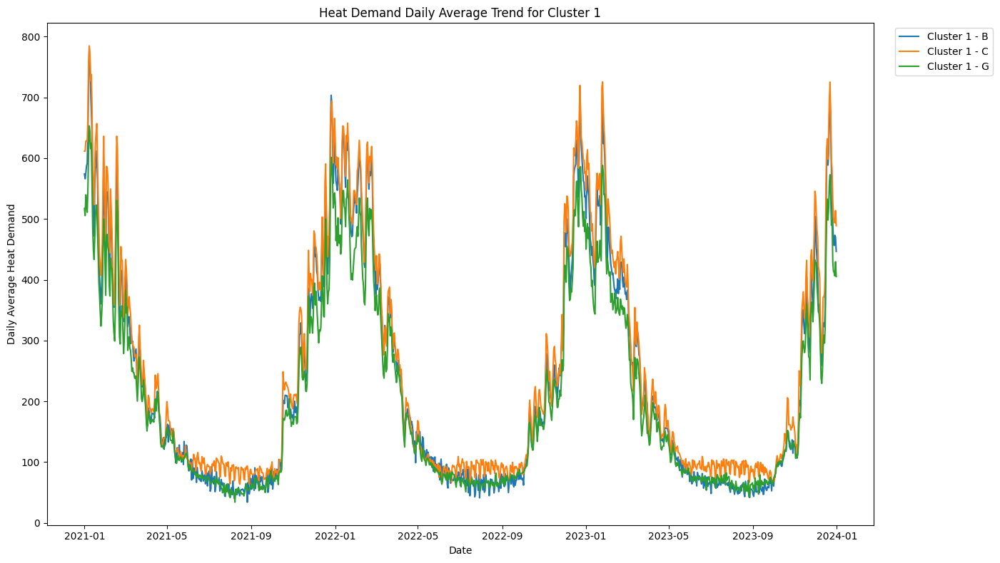

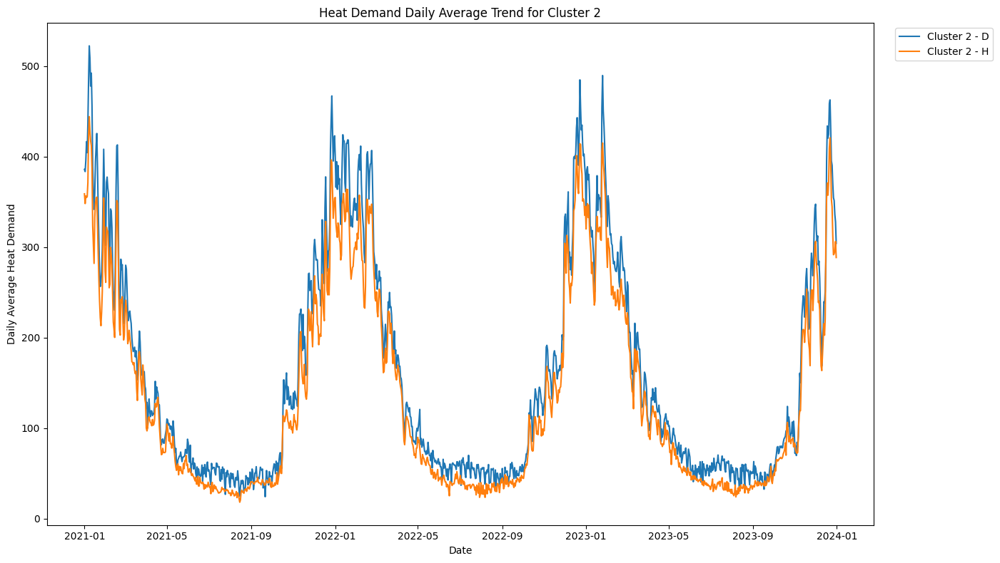

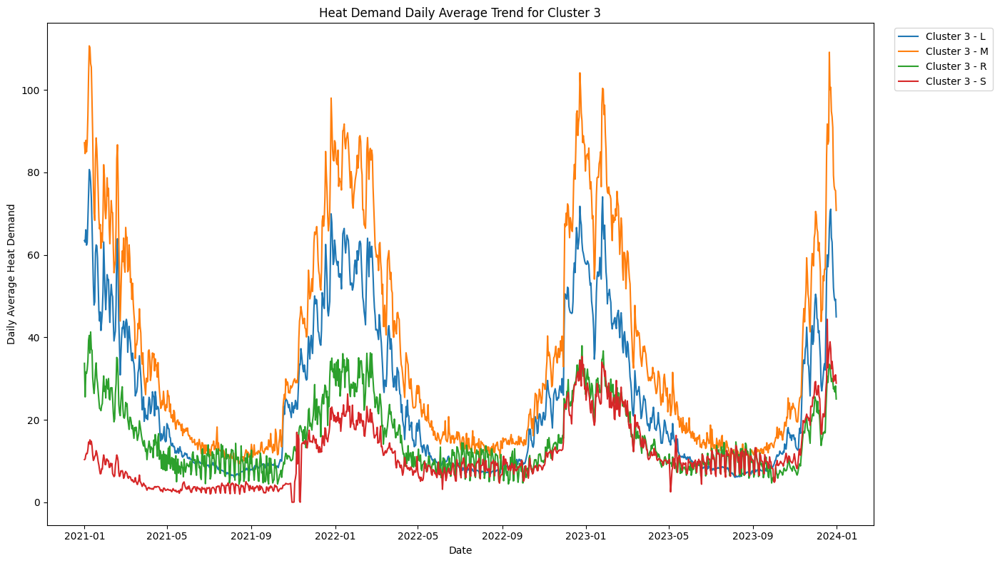

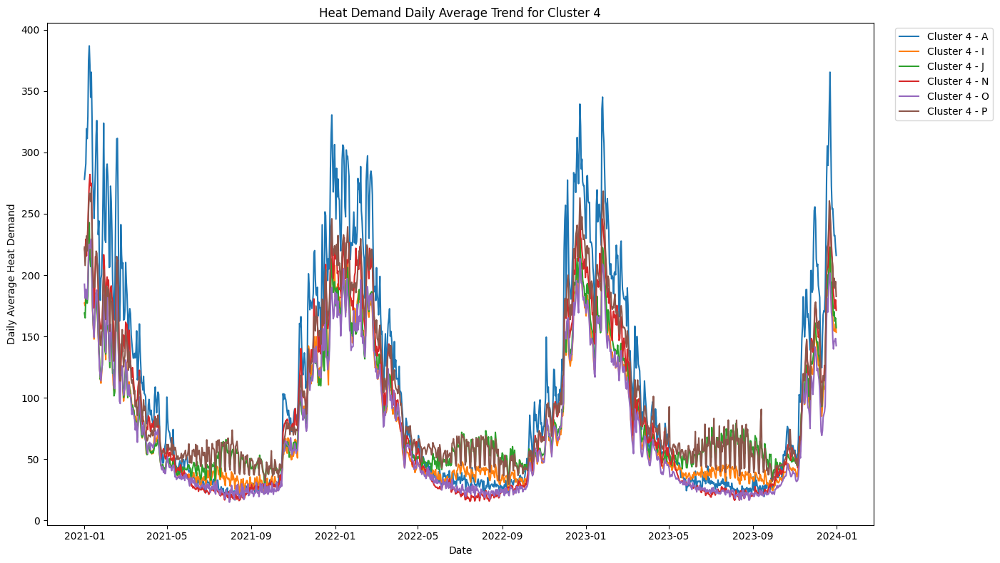

Silhouette Score: 0.364


In [39]:
# 혜현- 열수요만 고려 + 정규화 X + 클러스터 개수 =5
cluster_0 = ['E', 'F', 'K', 'Q']
cluster_1 = ['B', 'C', 'G']
cluster_2 = ['D', 'H']
cluster_3 = ['L', 'M', 'R', 'S']
cluster_4 = ['A', 'I', 'J', 'N', 'O', 'P']

plot_heat_demand_by_cluster(heat, cluster_0, 'Cluster 0')
plot_heat_demand_by_cluster(heat, cluster_1, 'Cluster 1')
plot_heat_demand_by_cluster(heat, cluster_2, 'Cluster 2')
plot_heat_demand_by_cluster(heat, cluster_3, 'Cluster 3')
plot_heat_demand_by_cluster(heat, cluster_4, 'Cluster 4')

clusters_dict = {
    'Cluster 0': cluster_0,
    'Cluster 1': cluster_1,
    'Cluster 2': cluster_2,
    'Cluster 3': cluster_3,
    'Cluster 4': cluster_4
}
silhouette_score_value = silhouette_score_for_heat_dynamic(heat, clusters_dict)

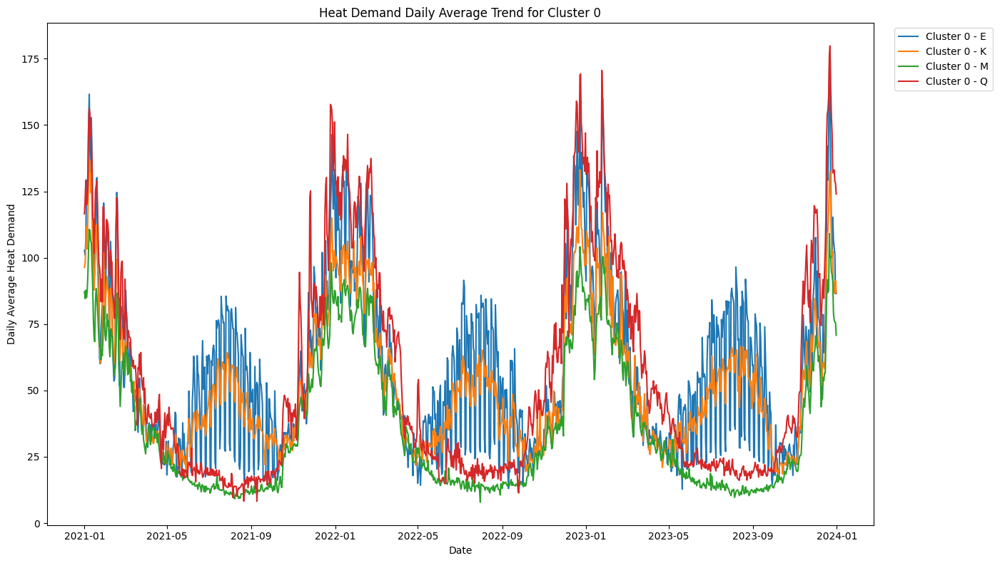

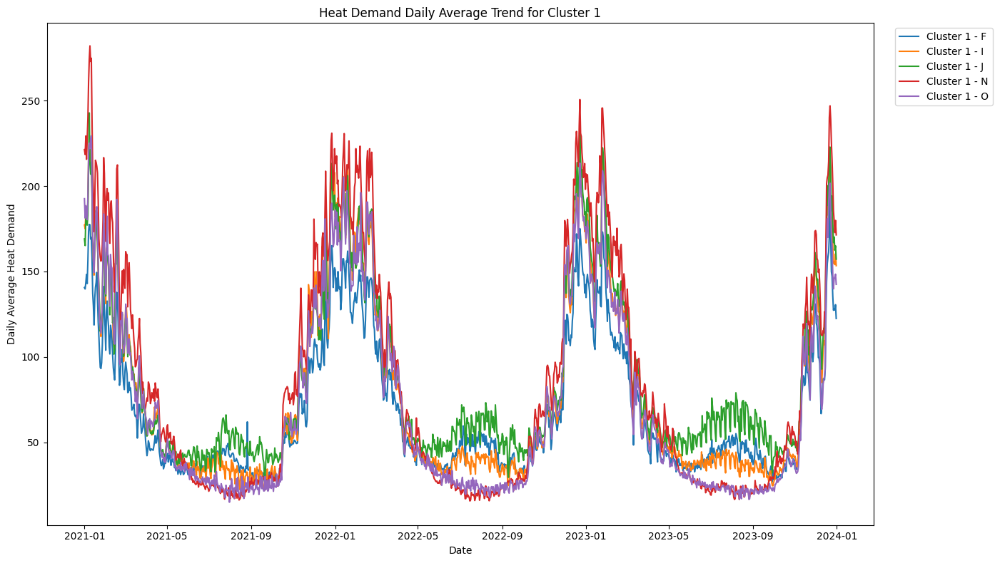

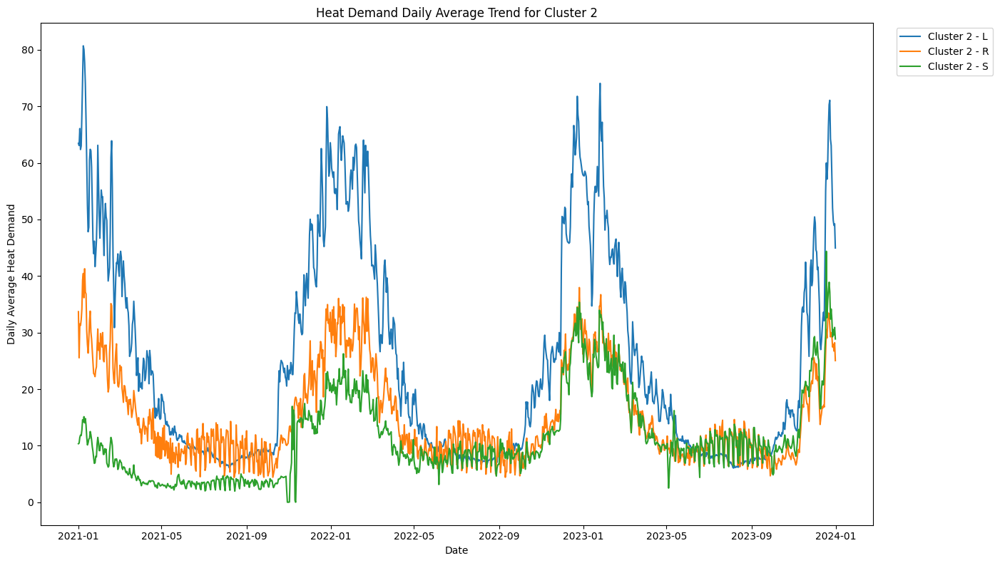

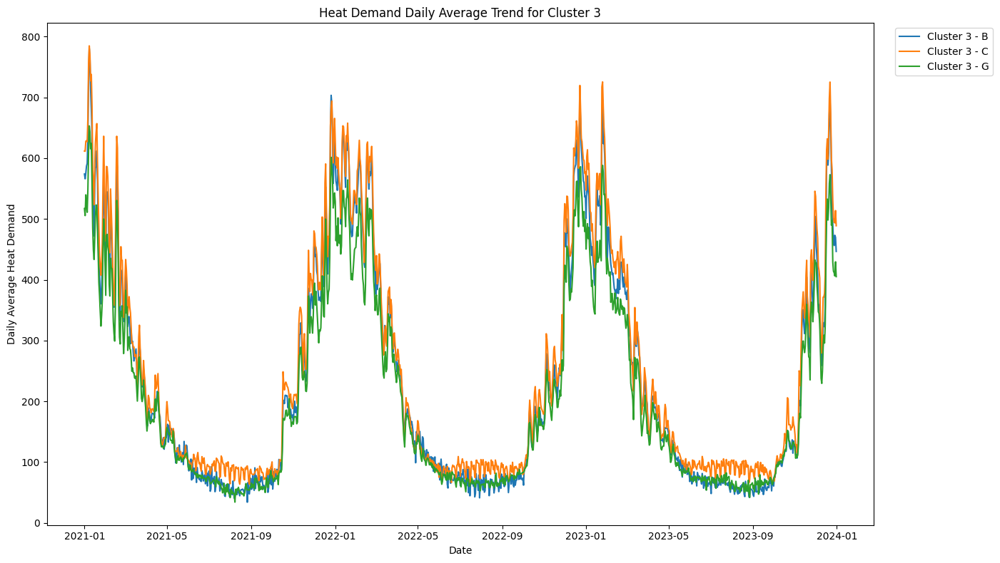

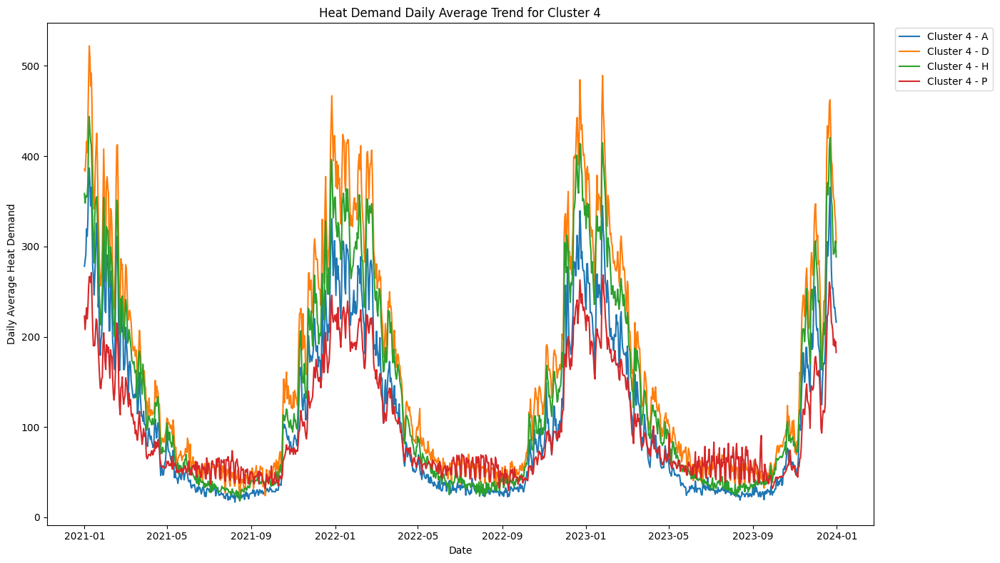

Silhouette Score: 0.299


In [40]:
# 혜현- 열수요만 고려 + 정규화 X + 클러스터 개수 = 4+1
cluster_0 = ['E', 'K', 'M', 'Q']
cluster_1 = ['F', 'I', 'J', 'N', 'O']
cluster_2 = ['L', 'R', 'S']
cluster_3 = ['B', 'C', 'G']
cluster_4 = ['A', 'D', 'H', 'P']

plot_heat_demand_by_cluster(heat, cluster_0, 'Cluster 0')
plot_heat_demand_by_cluster(heat, cluster_1, 'Cluster 1')
plot_heat_demand_by_cluster(heat, cluster_2, 'Cluster 2')
plot_heat_demand_by_cluster(heat, cluster_3, 'Cluster 3')
plot_heat_demand_by_cluster(heat, cluster_4, 'Cluster 4')

clusters_dict = {
    'Cluster 0': cluster_0,
    'Cluster 1': cluster_1,
    'Cluster 2': cluster_2,
    'Cluster 3': cluster_3,
    'Cluster 4': cluster_4
}
silhouette_score_value = silhouette_score_for_heat_dynamic(heat, clusters_dict)